In [1]:
import tensorflow as tf
import pandas as pd
import tensorflow.keras as keras
import os
import html
import re
from bs4 import BeautifulSoup
import numpy as np
import nltk
import multiprocessing as mp
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
nltk.download("stopwords")

from numpy.random import seed
seed(1)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [2]:
from google.colab import files
files.upload()

Saving BBCNEWS_Dataset.zip to BBCNEWS_Dataset.zip


{'BBCNEWS_Dataset.zip': b'PK\x03\x04\n\x00\x00\x00\x00\x00\x98"\x91N\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x00\x00\x00data/PK\x03\x04\n\x00\x00\x00\x00\x00\xab\x05~<\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0e\x00\x00\x00data/business/PK\x03\x04\x14\x00\x00\x00\x08\x00\xab\x05~<\xe8\xbdo\x93\x00\x05\x00\x00\x00\n\x00\x00\x15\x00\x00\x00data/business/001.txt}V\xdb\x8e\x139\x10}\x9f\xaf(\xa1A\x80\x94\x89\xc2\xdc\x80G`\x81EBbwa\xb5\xcf\xee\xee\xean3n\xbb\xf1%\x99\xfe\x1e\xfed\xbflO\xd9\xcee\x10\xda\x87(\x9d\xc4\xae\xaas\xea\xd4\xa9\xbc\xee((\xc3\x81\x1a\xe7B\xa4\xafzb\xfaGy\xcb\x9ef\xefz\x1d\xcf\xce\xfeL\xcaG\xf6f\xa9\xdf\x04R\x91\xfe\xfeB\x13wZ\xd1\xa0\x95-\xf7\xea\xb5oi\x9a\xb9\xa3\x17\xb7\x8f)::\x7f\xbe~~\xd5Xz\xfa\xef\x8f\xdb\xcdfzF\xbd\xf3\x14G\xc6\xcb3\xd3\xe4l\x1c\x83\x1c\xfc\x8d[\x9e\x1a\xf6+\xea\xbd\x9b\xe8\xfc\xf6\xea\xd5D\x0b+\x7f\x81\x97\xd1\xec\xd7gg_q\xaf\xd7~Z\xd1n\xd4\xedH:\x90u;r\x96\xc9\xf59j\xa3\x87\x81\x81C\xdb-\xde\x9c\x0fx\xa2\x0f\xce\r\x86W\xd4

In [3]:
!unzip "BBCNEWS_Dataset.zip" -d "../datasets/"

Archive:  BBCNEWS_Dataset.zip
   creating: ../datasets/data/
   creating: ../datasets/data/business/
  inflating: ../datasets/data/business/001.txt  
  inflating: ../datasets/data/business/002.txt  
  inflating: ../datasets/data/business/003.txt  
  inflating: ../datasets/data/business/004.txt  
  inflating: ../datasets/data/business/005.txt  
  inflating: ../datasets/data/business/006.txt  
  inflating: ../datasets/data/business/007.txt  
  inflating: ../datasets/data/business/008.txt  
  inflating: ../datasets/data/business/009.txt  
  inflating: ../datasets/data/business/010.txt  
  inflating: ../datasets/data/business/011.txt  
  inflating: ../datasets/data/business/012.txt  
  inflating: ../datasets/data/business/013.txt  
  inflating: ../datasets/data/business/014.txt  
  inflating: ../datasets/data/business/015.txt  
  inflating: ../datasets/data/business/016.txt  
  inflating: ../datasets/data/business/017.txt  
  inflating: ../datasets/data/business/018.txt  
  inflating: ../d

#### CODING EXERCISE: Create getListOfFiles(dirName) method

* Create a method called ```getListOfFiles()``` which accepts a ```dirName``` parameter, which is the directory name. The method will return a list of files name from a given directory, ```dirName``` including it's subfolders.

In [4]:
import os

def getListOfFiles(dirName):
    list_of_files = []
    for root, dirs, files in os.walk(dirName, topdown=False):
        for name in files:
            list_of_files.append(os.path.join(root, name))
    return sorted(list_of_files)

### Pre-Process the Data into a Pandas DataFrame

In [5]:
import pandas as pd


dirName = '../datasets/data';
    
# Get the list of all files in directory tree at given path
listOfFiles = getListOfFiles(dirName)
    

df=pd.DataFrame(columns=["Title","Description","Category"])
# Print the files    
for elem in listOfFiles:
    print("Reading: "+elem)
    file1 = open(elem,"r",encoding="latin-1") 
    sampleNews=file1.read().split("\n")
    newsDesc=""
    for strline in sampleNews[1:len(sampleNews)]:
        newsDesc+=strline
    """
    print("Category: "+elem.split("/")[1])
    print("Title:"+sampleNews[0])
    print("Description:"+newsDesc[0:50])
    """
    dfsample=pd.DataFrame(columns=["Title","Description","Category"],data=[[sampleNews[0],newsDesc,elem.split("/")[3]]])
    df=df.append(dfsample)

Reading: ../datasets/data/business/001.txt
Reading: ../datasets/data/business/002.txt
Reading: ../datasets/data/business/003.txt
Reading: ../datasets/data/business/004.txt
Reading: ../datasets/data/business/005.txt
Reading: ../datasets/data/business/006.txt
Reading: ../datasets/data/business/007.txt
Reading: ../datasets/data/business/008.txt
Reading: ../datasets/data/business/009.txt
Reading: ../datasets/data/business/010.txt
Reading: ../datasets/data/business/011.txt
Reading: ../datasets/data/business/012.txt
Reading: ../datasets/data/business/013.txt
Reading: ../datasets/data/business/014.txt
Reading: ../datasets/data/business/015.txt
Reading: ../datasets/data/business/016.txt
Reading: ../datasets/data/business/017.txt
Reading: ../datasets/data/business/018.txt
Reading: ../datasets/data/business/019.txt
Reading: ../datasets/data/business/020.txt
Reading: ../datasets/data/business/021.txt
Reading: ../datasets/data/business/022.txt
Reading: ../datasets/data/business/023.txt
Reading: ..

In [6]:
df.head()

,Title,Description,Category
0,Ad sales boost Time Warner profit,Quarterly profits at US media giant TimeWarner...,business
0,Dollar gains on Greenspan speech,The dollar has hit its highest level against t...,business
0,Yukos unit buyer faces loan claim,The owners of embattled Russian oil giant Yuko...,business
0,High fuel prices hit BA's profits,British Airways has blamed high fuel prices fo...,business
0,Pernod takeover talk lifts Domecq,Shares in UK drinks and food firm Allied Domec...,business


In [7]:
df=df.reset_index()
df=df.drop(list(df)[0], axis=1)
df["Description"].head()[0]

'Quarterly profits at US media giant TimeWarner jumped 76% to $1.13bn (Â£600m) for the three months to December, from $639m year-earlier.The firm, which is now one of the biggest investors in Google, benefited from sales of high-speed internet connections and higher advert sales. TimeWarner said fourth quarter sales rose 2% to $11.1bn from $10.9bn. Its profits were buoyed by one-off gains which offset a profit dip at Warner Bros, and less users for AOL.Time Warner said on Friday that it now owns 8% of search-engine Google. But its own internet business, AOL, had has mixed fortunes. It lost 464,000 subscribers in the fourth quarter profits were lower than in the preceding three quarters. However, the company said AOL\'s underlying profit before exceptional items rose 8% on the back of stronger internet advertising revenues. It hopes to increase subscribers by offering the online service free to TimeWarner internet customers and will try to sign up AOL\'s existing customers for high-spee

### CODING EXERCISE: Convert the Labels to Integers

Implement a code where in the ```category``` column in the Dataframe is converted to labels. You must also create a dictionary called ```cat_dict``` that contains the dictionary of the labels where in the keys are the true labels and the keys are the integers.

Hint: You can use the pandas ```.map()``` method

In [8]:
categories=df["Category"].unique().tolist()
cat_dict= {'business': 0, 'entertainment': 1, 'politics': 2, 'sport': 3, 'tech': 4}
print(cat_dict)
for x in categories:
    print(x+": "+str(len(df[df["Category"]==x])))
df["Category"]= df["Category"].map(cat_dict)

{'business': 0, 'entertainment': 1, 'politics': 2, 'sport': 3, 'tech': 4}
business: 510
entertainment: 386
politics: 417
sport: 511
tech: 401


#### CODING EXERCISE: Train-Test Split

Use Scickit-Learn's ```train_test_split()``` function to split the dataframe into 80%-20% Test-Split.

In [9]:
from sklearn.model_selection import train_test_split
RANDOM_STATE = 42

X_train,X_test,y_train,y_test= train_test_split(df.Description, df.Category, test_size=0.2, random_state=RANDOM_STATE)

train_sum=0
for x in categories:
    print(x+": "+str(len(y_train[y_train==cat_dict[x]])))
    train_sum+=len(y_train[y_train==cat_dict[x]])
print("Total Training Data: "+str(train_sum)+"\n")

test_sum=0
for x in categories:
    print(x+": "+str(len(y_test[y_test==cat_dict[x]])))
    test_sum+=len(y_test[y_test==cat_dict[x]])
print("Total Test Data: "+str(test_sum))

business: 395
entertainment: 314
politics: 341
sport: 409
tech: 321
Total Training Data: 1780

business: 115
entertainment: 72
politics: 76
sport: 102
tech: 80
Total Test Data: 445


## Pre-Processing
- Remove HTML Tags
- Removing Twitter handles (@) and Hashtags(#)
- Convert contractions
- Remove time formats
- Remove special characters
- Tokenization
- Removal of Stopwords

In this exercise, compared to the sample ```Sentiment Analysis - Experiments - Tensorflow.ipynb``` in which we import the stopwords due to the text having Filipino texts, in this exercise, the dataset is fully written in English. You can use the nltk stopwords instead.

In [10]:
def removeURLs(message) :

    urls = re.findall('http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+', message)

    dictOfurls = { i : 5 for i in urls }
    dictOfurls = dict(map(lambda x: (x[0],''), dictOfurls.items() ))

    for k, v in dictOfurls.items():
        message = message.replace(k, v)

    return message

In [11]:
def removeURLs2(message) :

    urls = re.findall('www.(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\(\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+', message)

    dictOfurls = { i : 5 for i in urls }
    dictOfurls = dict(map(lambda x: (x[0],''), dictOfurls.items() ))

    for k, v in dictOfurls.items():
        message = message.replace(k, v)

    return message

In [12]:
# create the function for removing the stop words
def remove_stop_words(s):
    s_cleaned=[]
    for w in s:
        if len(w)>=3 and w.lower() not in set(stopwords.words('english')):
            s_cleaned.append(w.strip())
    return s_cleaned

In [13]:
def preprocessing(text):
    #Remove and convert HTML Tags
    html_test = html.unescape(text)
    soup = BeautifulSoup(re.sub(r'[\n\r]', ' ', html_test))
    
    t2 = soup.get_text()
    
    #Removing Twitter handles before removing the URLs
    t2 = re.sub(r"(@\S+)*", "", t2)

    #Remove the URLs
    t2 = removeURLs(t2)
    t2 = removeURLs2(t2)

    #Remove remaining https://
    t2 = re.sub(r"https://", '', t2)

    #Remove 't
    t2 = re.sub(r"'nt", ' not', t2)
    t2 = re.sub(r"'t", ' not', t2)

    #Remove Twitter #s
    t2 = re.sub(r"(#\S+)*", "", t2)

    #Time Cleaning
    t2 = re.sub(r'\d*:\d+\s([aApP][mM])', '', t2)
    t2 = re.sub(r'\d*:\d+([aApP][mM])', '', t2)
    t2 = re.sub(r'\d+\s?([aApP][mM])', '', t2)
    t2 = re.sub(r'\d+:\d+', '', t2)

    #Special Character Cleaning
    t2 = re.sub(r"( -+ )", " ",t2)
    t2 = " ".join([re.sub(r'[^A-Za-zñ-]+', ' ', x) for x in t2.split()])
    t2 = re.sub(r"( - )", " ", t2)
    t2 = re.sub(r"(\s-\w+)", " ", t2)
    t2 = re.sub(r"(\w+-\s)", " ", t2)
    t2 = re.sub(r"( \w )", " ", t2)
    
    #tokenization and removal of stop words
    t2 = word_tokenize(t2)
    t2_clean = remove_stop_words(t2)
    
    return t2_clean

### Coding Exercise: Apply Pre-Processing on Data

Apply the ```preprocessing()``` method on the training and test data.

Hint: You can use pandas ```df.apply()``` method and multi-processing for faster running time.

In [17]:
nltk.download('punkt')
X_train_cleaned = X_train.apply(preprocessing)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [18]:
X_test_cleaned = X_test.apply(preprocessing)

## Feature Text Extraction
- In a deeplearning approach in NLP, Word Embeddings are used. 
- You can use Word2Vec, GloVE, or FastText Embeddings

Creation of Word2Index

In [19]:
words = set([])
 
for s in X_train_cleaned:
    for w in s:
        words.add(w.lower())


word2index = {w: i + 2 for i, w in enumerate(list(words))}
word2index['-PAD-'] = 0  # The special value used for padding
word2index['-OOV-'] = 1  # The special value used for OOVs

In [21]:
import json
files.upload()

json.dump(word2index, open("word2index.json", 'w' ))

Saving word2index.json to word2index.json


In [22]:
#Declare Model Parameters
cbow = 0
skipgram = 1
EMB_DIM = 100 #more dimensions, more computationally expensive to train
min_word_count = 2
workers = mp.cpu_count()-1 #based on computer cpu count
context_size = 5
downsampling = 1e-3
learning_rate = 0.025 #initial learning rate
min_learning_rate = 0.025 #fixated learning rate
num_epoch = 8

### CODING EXERCISE: Train Word2Vec Model using the Hyperparameters above.

In [23]:
from gensim.models import Word2Vec

word2vec = Word2Vec(
    sg = skipgram,
    size = EMB_DIM,
    workers = workers,
    window = context_size,
    sample = downsampling,
    alpha = learning_rate,
    min_alpha = min_learning_rate,
    hs = 0,
    negative = 10
)

word2vec.build_vocab(X_train_cleaned)
word2vec.train(X_train_cleaned,epochs=num_epoch,total_examples=word2vec.corpus_count)

print('Vocabulary size: %d' % len(words))
words_word2vec = list(word2vec.wv.vocab)
print("Vocabulary Size after Word2Vec:",len(words_word2vec))

##SAVE WORD2VEC FILE
filename = 'embedding_word2vec.txt'
word2vec.wv.save_word2vec_format(filename, binary=False)

Vocabulary size: 27096
Vocabulary Size after Word2Vec: 9624


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:254: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Create Embeddings Index

In [24]:
embeddings_index={}
f=open('embedding_word2vec.txt',encoding="utf-8")
for line in f:
    values=line.split()
    word=values[0]
    coefs=np.asarray(values[1:])
    embeddings_index[word]=coefs
f.close()

### Coding Exercise: Padding of Sentences

* Change the sentences in ```X_train_cleaned``` and ```X_test_cleaned```to integers using the ```word2index``` dictionary and put those sentences in ```train_sentences_X``` and ```test_sentences_X``` respectively.
* Pad the ```train_sentences_X``` and ```test_sentences_X``` based on the Max Length
* Your Max Length is dependent on the RAM of your device, the higher the Max Length, more RAM is needed to store in memory

In [25]:
train_sentences_X, test_sentences_X = [], []

num_words=len(word2index)+1
embedding_matrix=np.zeros((num_words,EMB_DIM))
for word,i in word2index.items():
    if i>num_words:
        continue
    embedding_vector=embeddings_index.get(word)
    if embedding_vector is not None:
        embedding_matrix[i]=embedding_vector

for s in X_train_cleaned:
    s_int = []
    for w in s:
        try:
            s_int.append(word2index[w.lower()])
        except KeyError:
            s_int.append(word2index['-OOV-'])
 
    train_sentences_X.append(s_int)
    
for s in X_test_cleaned:
    s_int = []
    for w in s:
        try:
            s_int.append(word2index[w.lower()])
        except KeyError:
            s_int.append(word2index['-OOV-'])
 
    test_sentences_X.append(s_int)

# MAX_LENGTH = len(max(train_sentences_X, key=len))
# YOU CAN CHANGE THE MAX LENGTH
MAX_LENGTH = 64
print(MAX_LENGTH) 

from keras.preprocessing.sequence import pad_sequences
 
train_sentences_X = pad_sequences(train_sentences_X, maxlen=MAX_LENGTH, padding='post')
test_sentences_X = pad_sequences(test_sentences_X, maxlen=MAX_LENGTH, padding='post')
y_train = y_train.values
y_test = y_test.values

print(train_sentences_X[0])

64
[16975 19046  3569 14203  2720 12320 23097 25615 20135 17917  3802  9407
 20901 23430 10029  4440   758 15440 25004 16111 19997 11507  5629  6185
  2720 10295 16748 23595 23988 17526  8648 25004  4440 10029 10413  9920
  9286  8210 21103 18274  5608 24430  7306   236 17071 16049  1242 10113
  5629  4642 19863 15519  6806 13073 11695 16049 10102 19863 15519   236
 10174  3569  9286 19128]


Using TensorFlow backend.


## Training the Model
- Use Keras Subclassing API rather than the Sequential API for flexibility

In [26]:
from keras import backend as K

def recall_m(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
        recall = true_positives / (possible_positives + K.epsilon())
        return recall

def precision_m(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
        precision = true_positives / (predicted_positives + K.epsilon())
        return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

### Coding Exercise: Create the Classifier

* Initialize your RNN model, it can be composed of vanilla RNN, GRUs, LSTMs, etc. 
* Remember to use the Embedding Layer before the LSTM layer
* Fine Tune the model to achieve atleast 90% accuracy on the dataset.

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, 64, 100)           2709900   
_________________________________________________________________
bidirectional (Bidirectional (None, 64, 512)           731136    
_________________________________________________________________
dropout (Dropout)            (None, 64, 512)           0         
_________________________________________________________________
bidirectional_1 (Bidirection (None, 512)               1574912   
_________________________________________________________________
dropout_1 (Dropout)          (None, 512)               0         
_________________________________________________________________
dense (Dense)                (None, 5)                 2565      
Total params: 5,018,513
Trainable params: 5,018,513
Non-trainable params: 0
______________________________________________

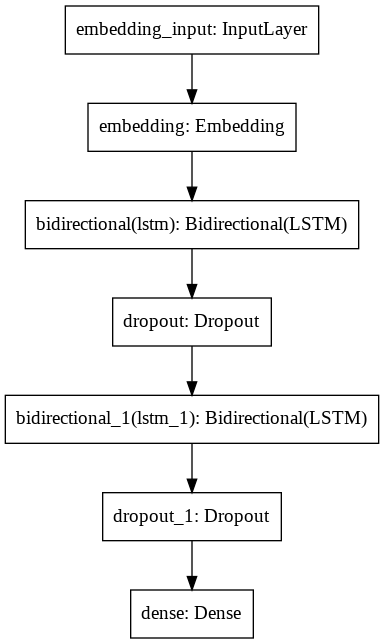

In [27]:
from tensorflow.keras.layers import Dense, LSTM, InputLayer, Bidirectional, Embedding, Activation,Dropout,Input,Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import regularizers
from tensorflow.keras.initializers import Constant
from tensorflow.keras.utils import plot_model
from tensorflow.keras.models import Model,Sequential

### your code here
# Init model

lstm_model = Sequential()
# Embedding layer
embedding_layer = Embedding(num_words,EMB_DIM,embeddings_initializer=Constant(embedding_matrix),input_length=MAX_LENGTH,trainable=True,mask_zero=True)
lstm_model.add(embedding_layer)

# 2 LSTM layers (taken from Sentiment Analysis - Experiments - Tensorflow)
lstm_model.add(Bidirectional(LSTM(256,activation="tanh",return_sequences=True,recurrent_dropout=0.3,kernel_initializer='random_uniform')))
lstm_model.add(Dropout(0.3))
lstm_model.add(Bidirectional(LSTM(256,activation="tanh",recurrent_dropout=0.3,kernel_initializer='random_uniform')))
lstm_model.add(Dropout(0.3))
lstm_model.add(Dense(len(np.unique(y_train)),activation="softmax"))

# compile
lstm_model.compile(loss='sparse_categorical_crossentropy',
              optimizer=Adam(0.001),    
              metrics=["accuracy",recall_m,precision_m,f1_m])
print(lstm_model.summary())
plot_model(lstm_model, to_file='lstm_model.png')

### Coding Exercise: Train the Classifier

* You can use ```EarlyStopping``` and ```ModelCheckpoint``` to optimize your training pipeline

In [28]:
from tensorflow.keras.callbacks import ModelCheckpoint,EarlyStopping
import os 

### your code here
es_valacc = EarlyStopping(monitor='val_accuracy', mode='max',verbose=1,patience=5,min_delta=0.003)
es_f1 = EarlyStopping(monitor='val_f1_m', mode='max',verbose=1,patience=7,min_delta=0.003)
es_loss = EarlyStopping(monitor='loss', mode='min',verbose=1,min_delta=0.003,patience=5)
save = ModelCheckpoint('best_model_lstm_train.hdf5', save_best_only=True, monitor='val_acc', mode='max')

# I have no idea why it's up to 45 only
# 5 epochs to avoid OOM error : https://github.com/mnicnc404/CartoonGan-tensorflow/issues/29
history_lstm=lstm_model.fit(train_sentences_X, y_train, validation_split=0.2, epochs=5, callbacks=[save,es_loss,es_valacc,es_f1])

Epoch 1/5
45/45 [==============================] - 64s 1s/step - loss: 0.6483 - accuracy: 0.7900 - recall_m: 1.3332 - precision_m: 56000000.0000 - f1_m: 1.5721 - val_loss: 0.5104 - val_accuracy: 0.8343 - val_recall_m: 1.1819 - val_precision_m: 1.0081 - val_f1_m: 1.0843
Epoch 2/5
45/45 [==============================] - 63s 1s/step - loss: 0.2564 - accuracy: 0.9185 - recall_m: 1.0757 - precision_m: 0.8625 - f1_m: 0.9533 - val_loss: 0.3444 - val_accuracy: 0.8792 - val_recall_m: 1.0768 - val_precision_m: 0.9019 - val_f1_m: 0.9778
Epoch 3/5
45/45 [==============================] - 63s 1s/step - loss: 0.2037 - accuracy: 0.9431 - recall_m: 1.0589 - precision_m: 0.8381 - f1_m: 0.9332 - val_loss: 0.2000 - val_accuracy: 0.9270 - val_recall_m: 1.0096 - val_precision_m: 0.8538 - val_f1_m: 0.9194
Epoch 4/5
45/45 [==============================] - 65s 1s/step - loss: 0.0931 - accuracy: 0.9691 - recall_m: 1.0193 - precision_m: 0.7972 - f1_m: 0.8928 - val_loss: 0.2465 - val_accuracy: 0.9101 - val_rec

### Save your Classifier for Inference

In [31]:
lstm_model.save('best_model_lstm_train.hdf5')  

dependencies = {
    'precision_m': precision_m,
    'recall_m': recall_m,
    'f1_m': f1_m
}

model_lstm=tf.keras.models.load_model("best_model_lstm_train.hdf5",custom_objects=dependencies)
scores = model_lstm.evaluate(test_sentences_X,y_test)
print(model_lstm.metrics_names)
print(scores)

14/14 [==============================] - 2s 171ms/step - loss: 0.2221 - accuracy: 0.9438 - recall_m: 1.0608 - precision_m: 0.7923 - f1_m: 0.9047
['loss', 'accuracy', 'recall_m', 'precision_m', 'f1_m']
[0.2221056967973709, 0.9438202381134033, 1.060837984085083, 0.7922791838645935, 0.9046879410743713]


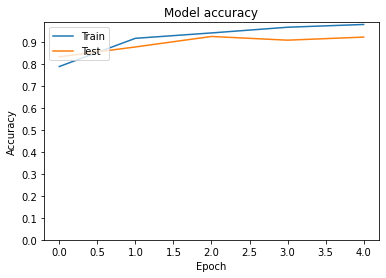

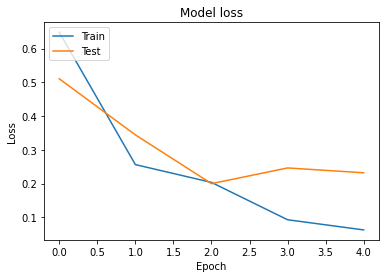

In [34]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.figure()
plt.plot(history_lstm.history['accuracy'])
plt.plot(history_lstm.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.yticks(np.arange(0,1,step=0.1))
plt.savefig("loss_lstm.png")

plt.figure( )
# Plot training & validation loss values
plt.plot(history_lstm.history['loss'])
plt.plot(history_lstm.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.savefig("loss_lstm.png")

### CODING EXERCISE: Create your Inference Pipeline

* Create an inference pipeline that uses the saved model

In [35]:
sample_text="Disney/Marvel’s Avengers: Endgame has moved up the offshore chart again, overtaking Avengers: Infinity War as the No. 3 highest grossing movie ever at the international box office. Friday’s overseas take was $88.2M, lifting the running cume to $1.4B. With the domestic Friday included, Endgame has a global total of $1,914.5M as it hammers its way to crossing the $2B mark by the end of today, a milestone we noted yesterday would be the case. Already through Thursday, Endgame became the No. 5 highest grossing global movie of all time, having passed Jurassic World. The next films the assembled Avengers have in their sights on the worldwide chart are Infinity War and Star Wars: The Force Awakens which will likely be toppled through Sunday. Internationally, Endgame is looking to soon dunk Titanic and become the No. 2 film ever overseas  Not included in the above Friday figures is the Saturday China estimate which is coming in around $21M. That’s a 41% drop from Friday and a 74% drop from last Saturday which was heavily frontloaded. In both cases, the Saturdays fall ahead of a workday Sunday which is intended to make up for the extended holiday period the market had this week. The local cume with Saturday’s estimate is $568.4M. Ticketing platform Maoyan continues to jockey its ultimate projection, today landing on RMB 4.08 ($606M). This Anthony and Joe Russo-helmed extravaganza has had a fantastic run through its first week, outperforming projections and breaking records along the way. That it topped Infinity War’s entire offshore run in just 10 days is indeed impressive. The conundrum on a lot of minds is now can-it beat Avatar globally. While it is possible that Endgame is comfortably above $2B worldwide through Sunday, sources are still cautious about calling this MCU pic the all-time champ. It could conceivably need another approximately $600M globally to get there. As we’ve noted previously, we are in uncharted waters with this incredibly anticipated movie. The film has little in its path over the coming frames, although there is a belief that Detective Pikachu could surprise next session, and certainly a lot will depend on how the Endgame midweeks go next week when markets come back down to Earth out of holiday play and the initial rush. Here are the Top 10 markets through Friday: China ($547.4M/does not include Saturday estimates above), UK ($75.6M), Korea ($68.4M), Mexico ($53.5M), Brazil ($47M), India ($45.7M), Germany ($39.9M), Australia ($39.8M), France ($37.3M) and Japan ($29.8M). More to come on Sunday."
print(sample_text)

Disney/Marvel’s Avengers: Endgame has moved up the offshore chart again, overtaking Avengers: Infinity War as the No. 3 highest grossing movie ever at the international box office. Friday’s overseas take was $88.2M, lifting the running cume to $1.4B. With the domestic Friday included, Endgame has a global total of $1,914.5M as it hammers its way to crossing the $2B mark by the end of today, a milestone we noted yesterday would be the case. Already through Thursday, Endgame became the No. 5 highest grossing global movie of all time, having passed Jurassic World. The next films the assembled Avengers have in their sights on the worldwide chart are Infinity War and Star Wars: The Force Awakens which will likely be toppled through Sunday. Internationally, Endgame is looking to soon dunk Titanic and become the No. 2 film ever overseas  Not included in the above Friday figures is the Saturday China estimate which is coming in around $21M. That’s a 41% drop from Friday and a 74% drop from las

In [36]:
lstm_file = "best_model_lstm_train.hdf5"

dependencies = {
    'precision_m': precision_m,
    'recall_m': recall_m,
    'f1_m': f1_m
}

model=tf.keras.models.load_model(lstm_file,custom_objects=dependencies)

In [37]:
def word_to_index(input_text):
    input_text_index=[]
    for w in input_text:
        try:
            input_text_index.append(word2index[w.lower()])
        except KeyError:
            input_text_index.append(word2index['-OOV-'])
    return input_text_index

In [38]:
print(cat_dict)

{'business': 0, 'entertainment': 1, 'politics': 2, 'sport': 3, 'tech': 4}


### Coding Exercise: Create a Method for Inference

* Create a method called ```classify_topic``` that takes a string as an input then the topic of the string as the output
* Remember to pre-process, convert the words to integers, then pad your input before calling model.predict()
* You can use the ```preprocessing()``` and ```word_to_index()``` function defined above.
* Since the model.predict() outputs only a softmax of the labels, you can use the ```cat_dict```, the dictionary of the labels to return the true labels, rather than an integer.

In [57]:
def classify_topic(input_text):
    if isinstance(input_text, str):
        input_text = preprocessing(input_text)
        input_text_index = word_to_index(input_text)
        input_text_pad=pad_sequences([input_text_index], maxlen=MAX_LENGTH, padding='post')
    else:
        #if batch processing
        input_text = [preprocessing(text) for text in input_text]
        input_text_index = [word_to_index(text) for text in input_text]
        input_text_pad=pad_sequences(input_text_index, maxlen=MAX_LENGTH, padding='post')

    predictions = model.predict(input_text_pad).tolist()

    for cat in cat_dict:
        if cat_dict[cat] == predictions[0].index(max(predictions[0])):
            return cat

In [58]:
print(classify_topic(sample_text))

entertainment
